In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
from scripts.db import *
from scripts.plots import *
from scripts.stats import *


 99% ( 99 of 100) |####################### | Elapsed Time: 0:00:50 ETA: 0:00:00

'INICIONIVEL tiene 528 entradas.'

'INICIONIVEL paso a tener 536 entradas.'

'RESULTADOS tiene 462 entradas.'

'RESULTADOS paso a tener 470 entradas.'

'SESION tiene 291 entradas.'

'SESION paso a tener 293 entradas.'

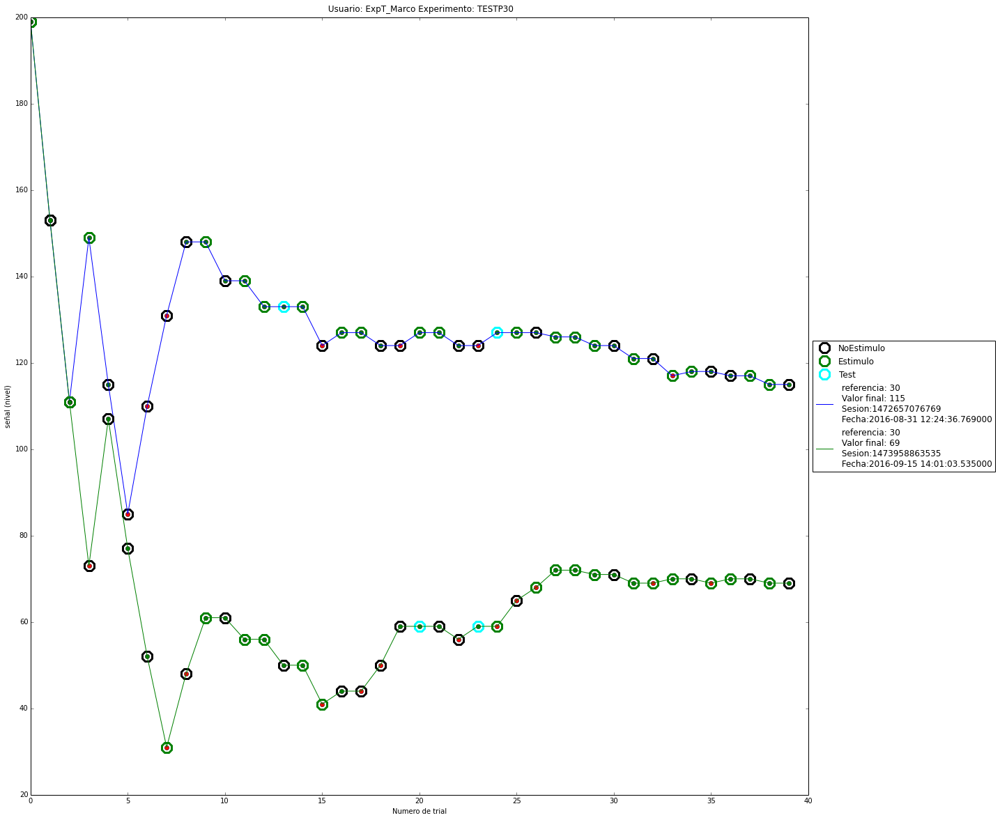

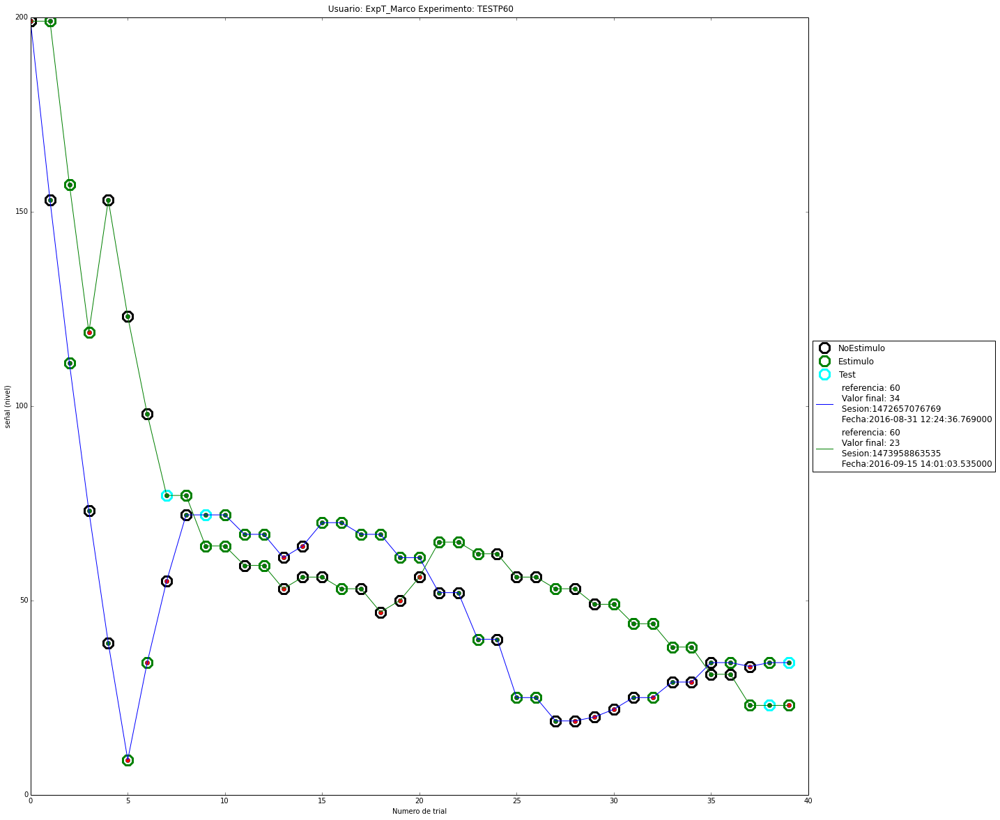

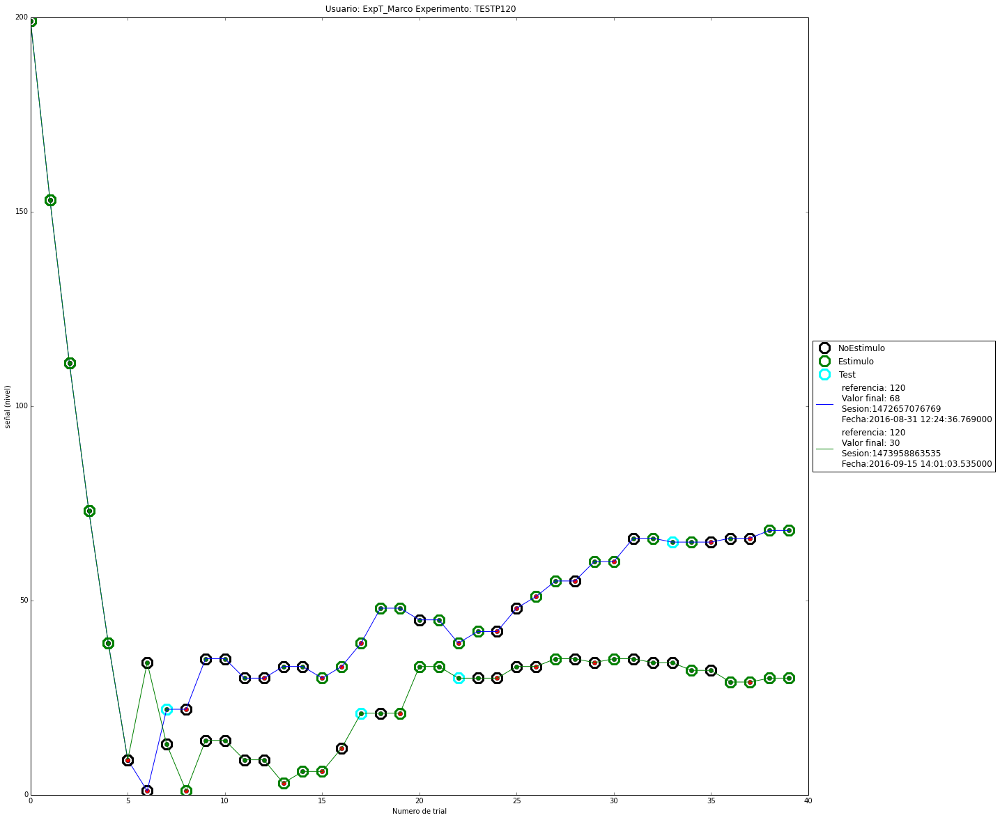

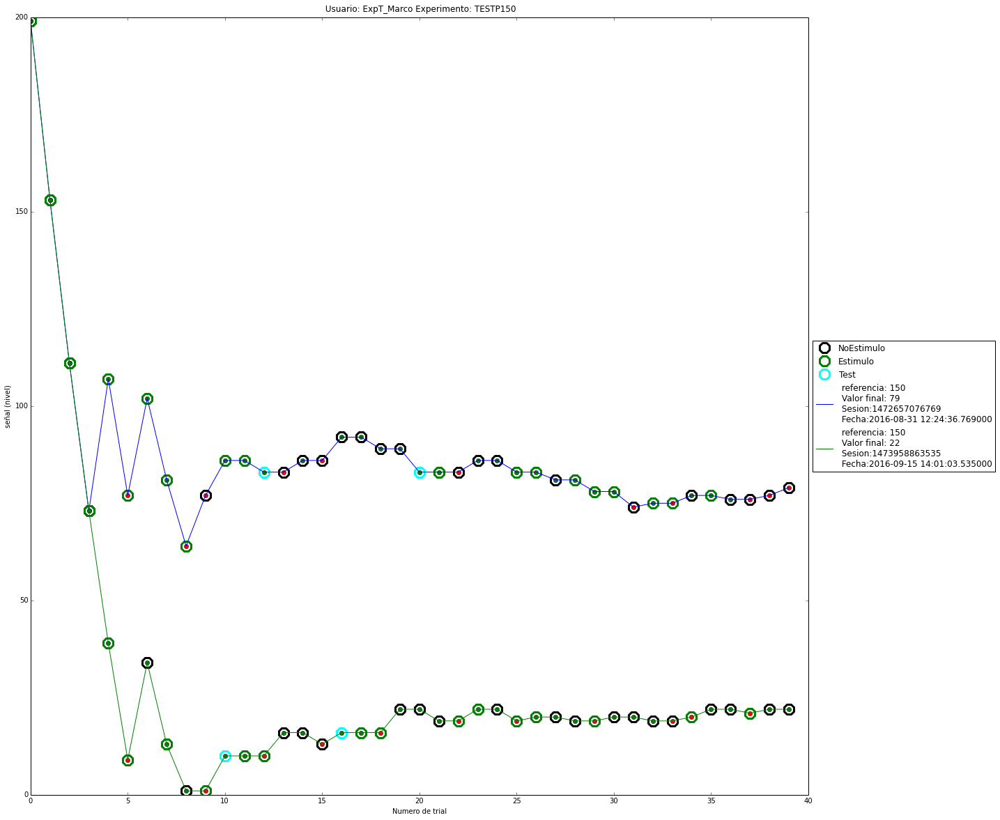

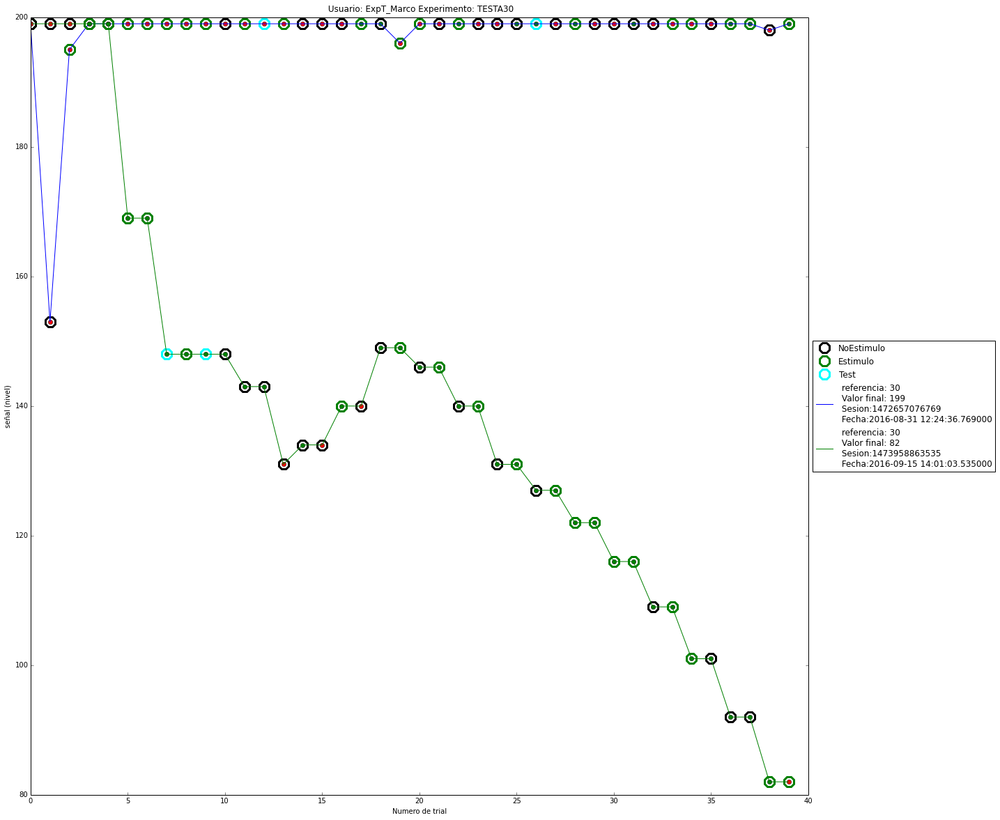

...

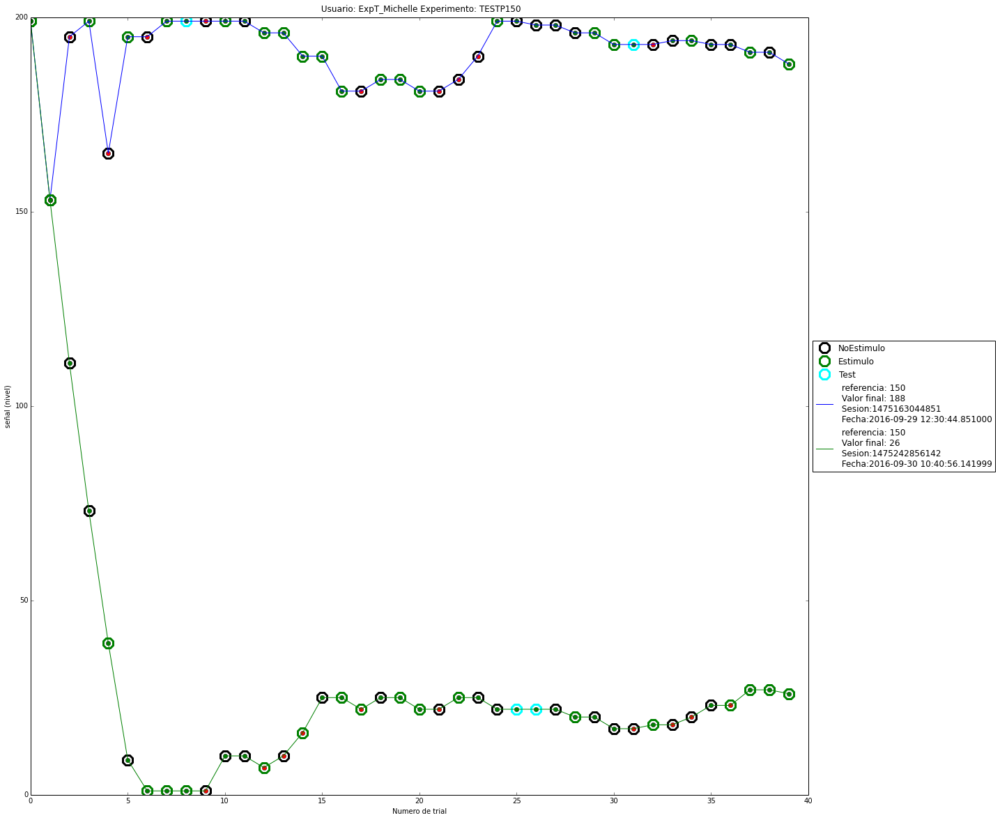

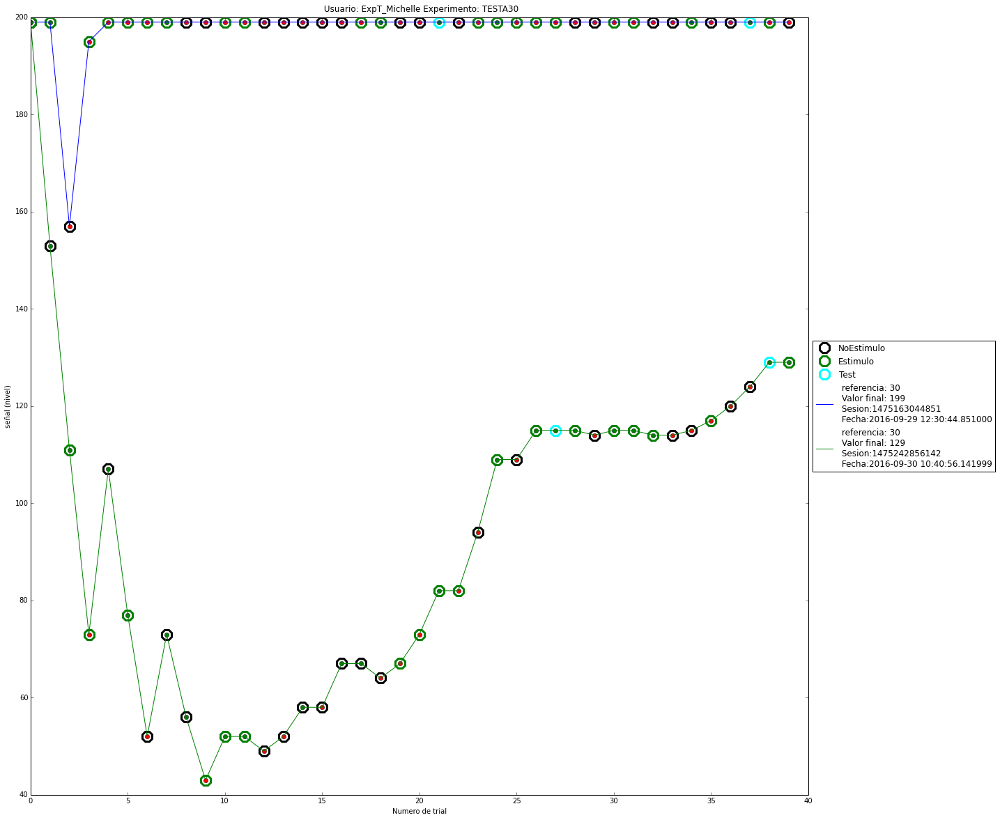

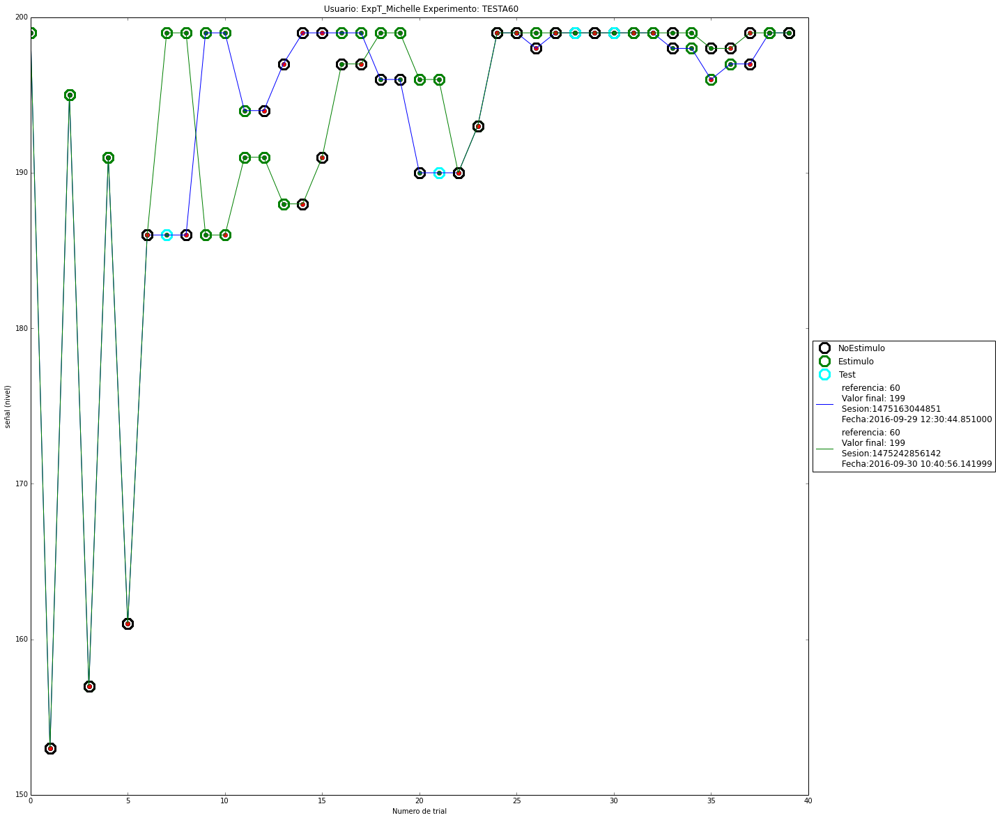

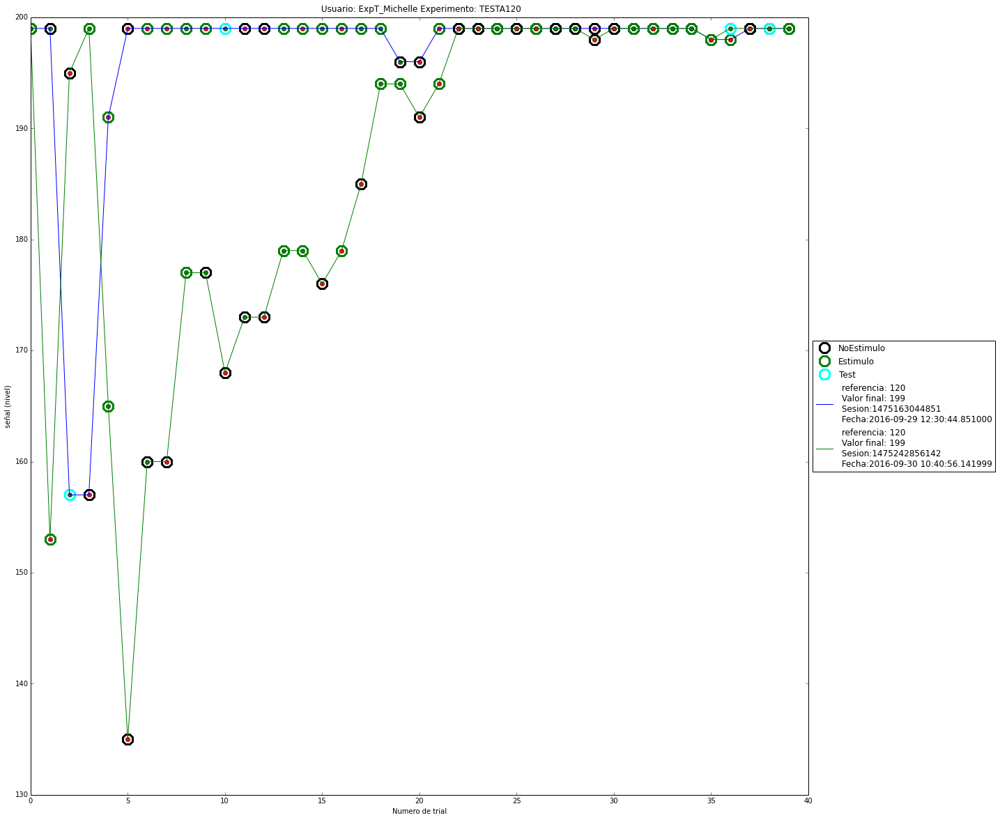

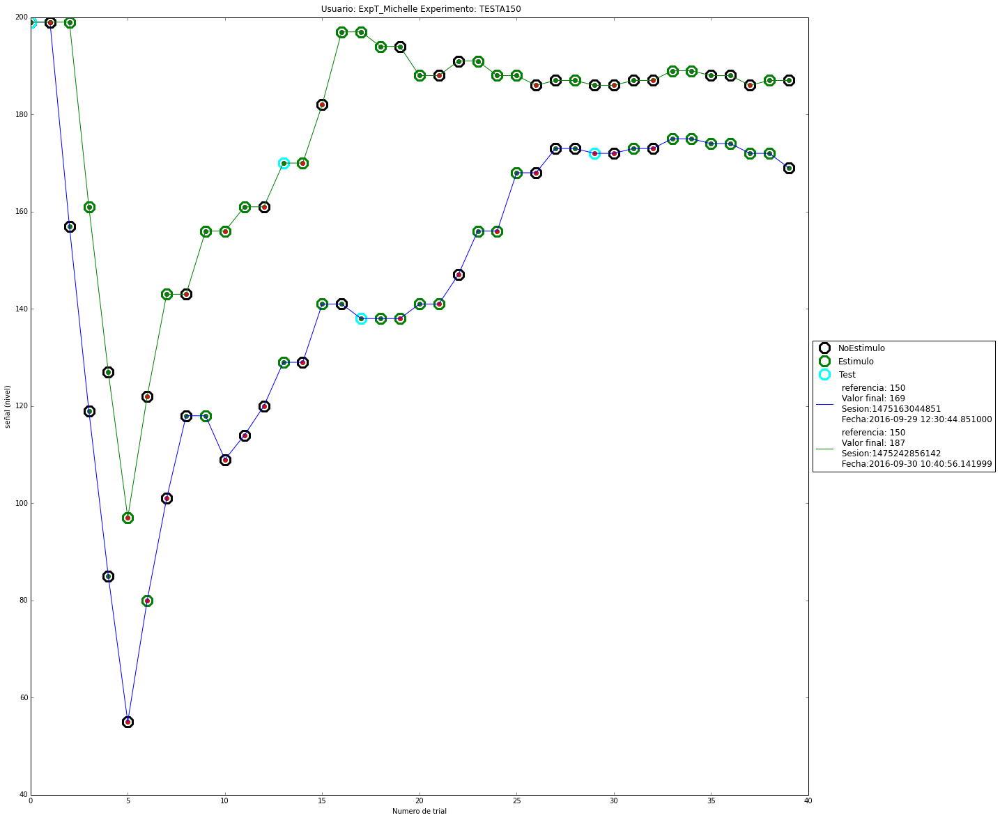

In [3]:
plotByUser(onlyOneUser=False, number=-2, join=True, filtroCompletadoActivo=True)

In [8]:
users, db = dataProcesada(onlyOneUser=False)


In [9]:
users

array(['ExpT_Marco', 'ExpT_Carolina', 'ExpT_Magdalena', 'ExpT_Ivan',
       'ExpT_Enzo', 'ExpT_Julieta', 'ExpT_Gaston', 'ExpT_Andres',
       'ExpT_CaroG', 'ExpT_Michelle'], dtype=object)

In [107]:
import pandas as pd

datos = []
#levels = [1475071227020,1473878349649]
levels = [1475071227020,1473879457447,1473878349649]
#levels = [1472737073971,1475071227020,1473879457447]

for lev in levels:
    data = db[db['levelInstance']==lev]
    dato = {}
    dato['Name'] = data.iloc[0]['identificadorNivel']
    dato['Tipo'] = list(data['TipoDeTrial'])
    dato['aciertos'] = list(data['RtaCorrecta'])
    dato['niveles'] = list(data['NivelSenalDinamica'])
    datos = datos + [dato]
    
DataLinda = pd.DataFrame(datos)

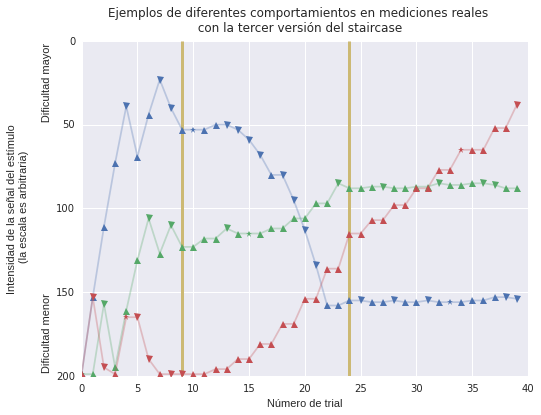

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")
fig, ax = plt.subplots(1,1,figsize=(8,6))

plt.axis([0, 40, 200, 0])


labels = ['La señal se estabiliza','La señal se estabiliza','La señal no se estabiliza']


colors=sns.color_palette()

for i,ind in enumerate(labels):
    #ax.plot([], label=DataLinda['Experimento'].iloc[ind]+' orientación: '+str(DataLinda['referencia'].iloc[ind]), color=colors[i])
    #ax.plot(DataLinda['niveles'].iloc[i], label=labels[i], color=colors[i], alpha=0.3)
    ax.plot(DataLinda['niveles'].iloc[i], color=colors[i], alpha=0.3)
    # Dibujamos los triangulos hacia abajo
    niveles = DataLinda['niveles'].iloc[i]
    tipos = DataLinda['Tipo'].iloc[i]
    aciertos = DataLinda['aciertos'].iloc[i]
    x = [indice for indice in range(len(niveles)) if (tipos[indice]!='Test' and aciertos[indice])]
    y = [niveles[indice] for indice in x]
    ax.plot(x, y, '^', color=colors[i])
    x = [indice for indice in range(len(niveles)) if (tipos[indice]!='Test' and not aciertos[indice])]
    y = [niveles[indice] for indice in x]
    ax.plot(x, y, 'v', color=colors[i])
    x = [indice for indice in range(len(niveles)) if (tipos[indice]=='Test')]
    y = [niveles[indice] for indice in x]
    ax.plot(x, y, '*', color=colors[i])
    
    
    # Dibujamos los triangulos hacia arriba
    #x = [indice for indice in range(len(DataLinda['niveles'].iloc[ind])) if not DataLinda['aciertos'].iloc[ind][indice]]
    #y = [DataLinda['niveles'].iloc[ind][indice] for indice in range(len(DataLinda['niveles'].iloc[ind])) if not DataLinda['aciertos'].iloc[ind][indice]]
    #ax.plot(x, y, 'v', color=colors[i])
    
ax.vlines(9, 0, 200, colors=sns.color_palette()[4], lw=3)
ax.vlines(24, 0, 200, colors=sns.color_palette()[4], lw=3)
plt.suptitle('Ejemplos de diferentes comportamientos en mediciones reales \n con la tercer versión del staircase')
plt.xlabel('Número de trial')
plt.ylabel('Intensidad de la señal del estímulo \n (la escala es arbitraria) \n \n Dificultad menor                                                         Dificultad mayor')

#plt.ylabel('Nivel de la señal (escala lineal arbitraria)')
#plt.text(-4,54,'Mayor dificultad',rotation=90, fontsize=10)

#ax.legend()
fig.savefig('./Images/StairCase3.png', bbox_inches='tight', dpi=600)


In [89]:
db['sessionInstance'].unique()

array([1472656569839, 1472657076769, 1472735915319, 1473263015372,
       1473356134429, 1473428568035, 1473710712932, 1473877180572,
       1473081567997, 1473265510045, 1473343575685, 1473694104602,
       1473861042758, 1473955805433, 1473085739536, 1473340433427,
       1475153930381, 1475154627201, 1473089055893, 1473253943655,
       1473336796730, 1473683211999, 1473958863535, 1473272903024,
       1473359288064, 1473708454534, 1473880645121, 1473962254164,
       1474027330449, 1473953238580, 1474036546800, 1474405271355,
       1475247744317, 1474925502990, 1475258135309, 1475069485018,
       1475171146004, 1475163044851, 1475242856142])

In [91]:
data = db[db['sessionInstance']==1473877180572]
data = data[data['identificadorNivel']=='TESTP120']

In [106]:
DataLinda

,Name,Tipo,aciertos,niveles
0,TESTA60,"[Estimulo, Estimulo, NoEstimulo, Estimulo, NoE...","[True, True, True, True, False, True, True, Fa...","[199, 153, 111, 73, 39, 69, 44, 23, 40, 53, 53..."
1,TESTP120,"[Estimulo, NoEstimulo, NoEstimulo, Estimulo, T...","[True, False, False, True, True, False, False,...","[199, 153, 195, 199, 165, 165, 190, 199, 199, ..."
